# 01: Introduction to Data and Preliminary EDA

# Contents

1. [Introduction](#introduction)
2. [Understanding the notion of a 'successful job match'](#data-familiarization)
   - [US National Survey of College Graduates](#loading-the-dataset)
   - [Overview of datasets](#xx)
3. [Exploring National Survey of College Graduates for 2021](#xx)
   - [Initial inspection and filtering of dataset](#xx)
   - [Data dictionary](#missing-data)
   - [Duplicate Entries](#duplicate-entries)
   - [Missing Data](#outliers-detection)
4. [Preliminary Exploratory Data Analysis (EDA)](#preliminary-exploratory-data-analysis)
   - ['Successful job matching' - constructing a composite y-variable](#univariate-analysis)
   - [Opportunities for feature engineering](#bivariate-analysis)
5. [Summary of findings](#initial-hypothesis-generation)
   - [Emerging insights](#identifying-relationships)
   - [Formulating Hypotheses](#formulating-hypotheses)
7. [Next steps](#conclusion)


## **1. Introduction**

As part of Sprint 1 for this project investigating graduate employment outcomes data to understand and predict 'likelihood of a successful job match'.

Here our primary goal is to familiarise ourselves with the dataset and the variables at our disposal. Through exploratory data analysis (EDA) and initial examination of the available features, we aim to lay a strong foundation for the subsequent stages of the project, where we will develop and refine our predictive models.

## **2. Understanding the notion of a 'successful job match'**

In evaluating the success of job matching, two primary indicators stand out: financial success and job satisfaction. Financial success is often measured by salary or income, traditionally seen as a key indicator of a successful job match. However, job satisfaction—encompassing aspects like the meaningfulness of work, alignment with future goals, and skill utilisation—is equally important in determining the overall quality of a job match. 

Together, these indicators provide a holistic view of how well a job aligns with a graduate's personal and professional aspirations.


**Our approach to assessing job matching success focuses on these three dimensions:**

1. Financial Success: This dimension will be analyzed primarily through salary data, which offers a quantifiable measure of financial outcomes for graduates, as well as self-reported measures of financial wellbeing

2. Job Satisfaction: Beyond salary, we will explore how satisfied graduates feel in their roles, particularly in terms of meaningfulness, alignment with career goals, and the extent to which they utilise their skills

3. Skills match: Finally, we think about alignment of graduates' skills and subject of study, which is a critical indicator of job match success

#### **US National Survey of College Graduates**

The U.S. National Survey of College Graduates (NSCG) is a recurring survey conducted by the National Science Foundation (NSF) that collects detailed information on the educational background, employment status, and career paths of individuals with at least a bachelor's degree in the United States. 

* The NSCG is used to assess trends in the labor market, particularly within science and engineering fields, and to inform policies related to education, workforce development, and economic competitiveness. 
* The survey provides valuable insights into the experiences and outcomes of college graduates, including factors like job satisfaction, salary, and the relevance of education to employment.

The NSCG dataset is collected in a cyclical manner, with major surveys conducted every two to three years. 

This means that each dataset provides a **snapshot of the U.S. college graduate population at a specific point in time**, allowing for both cross-sectional analysis and, to some extent, longitudinal insights when comparing data across different survey years.

#### **Overview of main datasets**





We'll be focusing on combining survey responses across **three datasets** / timeppoints:


* **2017 Dataset**: This dataset captures the state of the U.S. college graduate workforce in 2017. It was part of the regular NSCG cycle, providing insights into the educational background and employment status of graduates as of that year.

* **2019 Dataset**: Two years later, the 2019 dataset was released, continuing to track the same trends but reflecting any changes or shifts in the workforce over that period. This dataset is particularly valuable for understanding how the job market evolved during these years, especially in response to technological advancements and other economic factors.

* **2021 Dataset**: The most recent dataset, from 2021, provides a post-pandemic snapshot of the college graduate workforce. This survey cycle is crucial for understanding the impact of COVID-19 on job satisfaction, employment status, and salary trends among graduates.


In this preliminary analysis, we'll start by getting familiar with the structure of the 2021 dataset. This dataset will serve as our foundation for understanding the NSCG's data format, variable definitions, and key trends. Once we're comfortable with the 2021 dataset, we'll apply this understanding to the 2017 and 2019 datasets, allowing us to compare and analyse changes over time.

(**Note**: there is earlier survey data available - as our anlaysis progresses, we may wish to include this data to better uncover trends )

## **3. Exploring National Survey of College Graduates for 2021**

We can begin by loading our very first sub-dataset from 2021. We begin by importing our necessary libraries:

In [291]:
# Importing essential libraries
import pandas as pd          
import numpy as np         
import matplotlib.pyplot as plt  
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px
import os

### **Initial inspection and filtering of dataset**

In [292]:
#Loading in nscg dataset
nscg_21 = pd.read_sas("../data/pcg21Public/epcg21.sas7bdat")

In [293]:
#We need to ensure we convert form byte to string as this specific dataset uses SAS files
nscg_21 = nscg_21.applymap(lambda x: x.decode('utf-8') if isinstance(x, bytes) else x)

/var/folders/d8/f47z80nj3835j2cjhqsrtc6r0000gn/T/ipykernel_6510/3824119413.py:2: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



Now that we've loaded in our dataset, inspecting the head:

In [294]:
nscg_21.head()

,ACADV,ACCAR,ACCCEP,ACCHG,ACDRG,ACEM,ACFPT,ACGRD,ACINT,ACLIC,...,WRKGP,WTRCHOC,WTREASN,WTREM,WTRLIC,WTROPPS,WTROT,WTRPERS,WTRSKL,WTSURVY
0,L,L,L,L,L,L,L,L,L,L,...,Y,Y,5,Y,Y,Y,N,N,Y,1773.4187
1,L,L,L,L,L,L,L,L,L,L,...,Y,Y,1,N,Y,Y,N,N,Y,91.5643
2,L,L,L,L,L,L,L,L,L,L,...,Y,N,1,N,Y,N,N,Y,Y,943.7777
3,Y,Y,Y,N,2,N,2,N,Y,N,...,Y,N,1,N,N,N,N,N,Y,470.5196
4,L,L,L,L,L,L,L,L,L,L,...,Y,L,L,L,L,L,L,L,L,6173.4583


With 537 columns, we can see there are a huge number of columns present in the dataset. This makes sense, upon inspection of the main survey used by the producers of the dataset. However, rather than attempting to cleanse and inspect all columns, we know we will need to ensure we've filtered the data appropriately for individuals **currently in employment / in employment at the time of the survey** only.

Furthermore, we know that a range of columns will be especially pertinent to our dataset, so we would aim to keep this in the dataset.

The website hosting the datasets also has accompanying documentation, providing descriptions of the variables. We can read this in, as we'll want to update columns to have readable names:

In [295]:
#We'll also load in a separate excel file provided, as this contains information on variable names and descriptions
map_names = pd.read_excel("../data/pcg21Public/Dpcg21.xlsx")

/opt/anaconda3/envs/nivi_capstone/lib/python3.11/site-packages/openpyxl/styles/stylesheet.py:237: UserWarning:

Workbook contains no default style, apply openpyxl's default



For now, we can create the mapping_dict below - this will be our reference point so we can refer to the variables more easily and also rename our columns to be more friendly. For now we will keep in the SAS names for the variables, to conduct our main form of filtering.

In [296]:
#  Create a mapping dictionary with SAS_NAME as the key and (SESTAT_NAME, DESCRIPTION) as the value
mapping_dict = {row['SAS_NAME']: (row['SESTAT_NAME'], row['DESCRIPTION']) for _, row in map_names.iterrows()}


Firstly, we need to filter the dataset to focus on **non-students only**, meaning that work/employment is their primary activity. We'll have to make some assumptions, and focus on individuals who were classified as **working for pay or profit during the time of the survey**, and who were also **not a student in a part-time or full-time degree** at that time.

The relevant columns are 'LFSTAT' and 'ACFPT' - we want to filter for where during the time of the survey, someone was employed (LFSTAT) and we want to ensure that at the time of the survey they were not a full-time or part-time student on a degree programme, given our focus on individuals in employment.

In [297]:
#Double checking names
print(mapping_dict['LFSTAT'])
print(mapping_dict['ACFPT'])

('A_JOB_STATUS_LABOR_FORCE_STAT', 'Labor force status')
('N_ED_REF_WK_ENROLL_FT_PT_IND', 'Taking courses/enrolled during reference week: enrollment status')


### **Creating a df copy prior to filtering**

In [298]:
#First, creating a copy of the dataframe before filtering
new_nscg_21 = nscg_21.copy()

In [299]:
#Next, checking the datatypes present within this dataframe.
print(new_nscg_21.dtypes)
print(new_nscg_21.shape)

ACADV       object
ACCAR       object
ACCCEP      object
ACCHG       object
ACDRG       object
            ...   
WTROPPS     object
WTROT       object
WTRPERS     object
WTRSKL      object
WTSURVY    float64
Length: 537, dtype: object
(106279, 537)


We can see there are a number of objects, but in total 537 columns - which is a lot, and 106,279 rows of data. We will come back to dealing with these datatypes, as we whittle down our key variables of interest.

To start with, let's look at the datatypes for our two filters relating to employment status.

In [300]:
print(new_nscg_21.dtypes[['LFSTAT', 'ACFPT']])

LFSTAT    object
ACFPT     object
dtype: object


We may need to convert this into numeric to carry out our filtering and aggregation - but first let's double check the distinct values in this.

In [301]:
#Checking datatypes
new_nscg_21[['LFSTAT', 'ACFPT']].apply(pd.Series.value_counts)

,LFSTAT,ACFPT
1,88995.0,3856
2,3620.0,2278
3,13664.0,872
L,NaN,99273


We can convert values 1-3 to numeric, but we need to be careful about 'L' which is a logical skip - i.e., where a survey respondent doesn't answer this question due to a preceding question in the survey.

For LFSTAT - Labour force status, we can filter this out naturally as we will be focusing on employed people only. 

However, for ACPFT, we might **consider combining 'L' with '3'**, as both refer to a category where a respondent is NOT enrolled in a full-time or part-time degree.

In [302]:
# Map 3 and 'L' in ACFPT to '3'
new_nscg_21['ACFPT'] = new_nscg_21['ACFPT'].replace({'L': 3})

Then let's convert these two variables to numeric to support our filtering of the data:

In [303]:
new_nscg_21['LFSTAT'] = pd.to_numeric(new_nscg_21['LFSTAT'], errors='coerce') #converting any other accidental string into the same numeric dtype
new_nscg_21['ACFPT'] = pd.to_numeric(new_nscg_21['ACFPT'], errors='coerce')

In [304]:
#Double checking data type has been updated as intended
print(new_nscg_21.dtypes[['LFSTAT', 'ACFPT']])

LFSTAT    int64
ACFPT     int64
dtype: object


Now, we can go ahead and filter our dataset to focus on employed individuals/graduates.

* LFSTAT == 1 filters for individuals who are employed.
* ACFPT == 3 filters for those who are not enrolled in a full-time or part-time degree.

### **Creating a copy for filtering to respondents are currently in employment only**

In [305]:
# LFSTAT == 1 filters for individuals who are employed.
# ACFPT == 3 filters for those who are not enrolled in a full-time or part-time degree.

#Deep copy prior to filtering
employed_nscg_21 = new_nscg_21.copy()

employed_nscg_21 = new_nscg_21[(new_nscg_21['LFSTAT'] == 1) & (new_nscg_21['ACFPT'] == 3)]


In [306]:
# Drop the LFSTAT and ACFPT columns
# We drop these columns because they have served their purpose in filtering the data and are no longer needed in the final DataFrame.

employed_nscg_21.drop(columns=['LFSTAT', 'ACFPT'], inplace=True)

/var/folders/d8/f47z80nj3835j2cjhqsrtc6r0000gn/T/ipykernel_6510/1034711312.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [307]:
# Double check shape
print(employed_nscg_21.shape)

(84077, 535)


We've now filtered columns for our relevant respondents of interest. Now, we can inspect the variables better, before proceeding to check for duplicates and missing values.

### **Data dictionary**

In our initial exploration, we encountered over 500 columns of data. While this dataset is comprehensive, not all variables are relevant to assessing job match success. Guided by theory and supported by literature (see examples of references below), we have begun by exploring key variables that align with the core dimensions of job match success: Financial Success, Job Satisfaction, and Skills Match. 

We’ve excluded columns that are not pertinent to these dimensions, **though we are likely to revisit and inspect additional variables as the analysis progresses, as as we evaluate our model.**

Please see the data dictionary presented below:

References:
* Higher Education Statistics Agency (HESA). (2020). Career Satisfaction by Ethnicity.
* Spector, P. E. (1997). Job Satisfaction: Application, Assessment, Causes, and Consequences.
* HiRize. (2021). How ML-Based Job-Resume Matching Algorithms Work.

| Raw Data - Variable_Name | Variable Name        | Description                                              | Data Structure                                                                                                           |
|--------------------------|----------------------|----------------------------------------------------------|--------------------------------------------------------------------------------------------------------------------------|
| JOBSATIS                | job_satisfaction     | Job satisfaction                                         | 1: Very satisfied, 2: Somewhat satisfied, 3: Somewhat dissatisfied, 4: Very dissatisfied, L: Logical Skip                |
| SATSAL                  | satisfaction_salary  | Satisfaction with job's salary                           | 1: Very satisfied, 2: Somewhat satisfied, 3: Somewhat dissatisfied, 4: Very dissatisfied, L: Logical Skip                |
| SATADV                  | satisfaction_advancement | Satisfaction with advancement opportunities          | 1: Very satisfied, 2: Somewhat satisfied, 3: Somewhat dissatisfied, 4: Very dissatisfied, L: Logical Skip                |
| SATBEN                  | satisfaction_benefits    | Satisfaction with benefits                           | 1: Very satisfied, 2: Somewhat satisfied, 3: Somewhat dissatisfied, 4: Very dissatisfied, L: Logical Skip                |
| SATCHAL                 | satisfaction_challenges  | Satisfaction with job's intellectual challenge                          | 1: Very satisfied, 2: Somewhat satisfied, 3: Somewhat dissatisfied, 4: Very dissatisfied, L: Logical Skip                |
| SATLOC                  | satisfaction_location    | Satisfaction with job location                        | 1: Very satisfied, 2: Somewhat satisfied, 3: Somewhat dissatisfied, 4: Very dissatisfied, L: Logical Skip                |
| SATSEC                  | satisfaction_security    | Satisfaction with job security                        | 1: Very satisfied, 2: Somewhat satisfied, 3: Somewhat dissatisfied, 4: Very dissatisfied, L: Logical Skip                |
| SALARY                  | salary                | Salary (annualized)                                      | 0-9999996: Value, 9999998: Logical Skip                                                                                   |
| FACSOC                  | importance_society_contribution | Self-rated assessment / view of their job's contribution to society | 1: Very important, 2: Somewhat important, 3: Somewhat unimportant, 4: Not important at all, L: Logical Skip             |
| OCEDRLP                 | job_degree_relation   | Extent that principal job is related to highest degree   | 1: Closely related, 2: Somewhat related, 3: Not related, L: Logical Skip                                                  |
| N2MRMED                 | recent_degree_field   | Field of study of major for most recent degree           | Code for field of study during reference week - best code                                                                 |
| MRDG                | recent_degree_type  | Type of degree for most recent degree           | 1 - Bachelor's, 2 - Masters, 3 - Doctorate, 4 -Professional code                                                                 |
| GENDER                    | gender               | Gender                                                   | F: Female, M: Male                                                                                                        |
| AGE                       | age                  | Age                                                      | Age number                                                                                                               |
| AGEGR                     | age_group            | Age group (5 year intervals)                             | 20: Ages 24 or younger, 25: Ages 25-29, 30: Ages 30-34, etc.                                                              |            |
| RACEM                     | race                 | Race                                                     | 1: Asian ONLY, 2: American Indian/Alaska Native ONLY, 3: Black ONLY, 4: White ONLY, 5: Native Hawaiian/Other Pacific Islander ONLY, 6: Multiple Race |
| EMSECDT                   | employer_sector_detailed | Employer sector (detailed codes)                     | 11: 4-yr coll/univ; med schl; univ. res. inst., 12: 2-yr coll/pre-college institutions, 21: Bus/Ind, for-profit, etc.   |
| EMSECSM                   | employer_sector_summary | Employer sector (summary codes)                       | 1: Educational Institution, 2: Government, 3: Business/Industry, L: Logical Skip                                          |
| EMSIZE                    | employer_size        | Employer size                                            | 1: 10 or fewer employees, 2: 11-24 employees, 3: 25-99 employees, 4: 100-499 employees, etc.                             |
| EMST                      | employer_location    | State/country code for employer                          | Various codes for U.S. regions, states, and countries, L: Logical Skip                                                    |
| MARSTA                     | marital_status       | Marital Status                                           | 1: Married, 2: Living in a marriage-like relationship, 3: Widowed, 4: Separated, 5: Divorced, 6: Never married           |
| RESPLO3                   | respondent_location_code | 3-Digit respondent location (state/country code)       | Various codes for U.S. regions, states, and countries, L: Logical Skip                                                    |
| CTZUSIN                   | citizenship_status    | U.S. citizenship status                                  | N: Non-U.S. citizen, Y: U.S. citizen                                                                                      |
| CHLVIN                    | children_in_household | Children living in household                             | N: No, Y: Yes                                                                                                             |

Below are the steps taken to filter our dataset for these relevant variables, assigning new (more readable) column names, as noted in the second column of our data dictionary:

### **Final deep copy of df, keeping relevant columns**

In [308]:
#Creating a final deep copy of the 2021 survey data, with dropped columns
final_nscg_21 = employed_nscg_21.copy()

In [309]:
# Creating a column_mapping dictionary to assign new more readable column names, aligned to the data dictionary
column_mapping = {
    "JOBSATIS": "job_satisfaction",
    "SATSAL": "satisfaction_salary",
    "SATADV": "satisfaction_advancement",
    "SATBEN": "satisfaction_benefits",
    "SATCHAL": "satisfaction_challenges",
    "SATLOC": "satisfaction_location",
    "SATSEC": "satisfaction_security",
    "SALARY": "salary",
    "FACSOC": "importance_society_contribution",
    "OCEDRLP": "job_degree_relation",
    "N2MRMED": "recent_degree_field",
    "MRDG": "recent_degree_type",
    "GENDER": "gender",
    "AGE": "age",
    "AGEGR": "age_group",
    "RACEM": "race",
    "EMSECDT": "employer_sector_detailed",
    "EMSECSM": "employer_sector_summary",
    "EMSIZE": "employer_size",
    "EMST": "employer_location",
    "MARSTA": "marital_status",
    "RESPLO3": "respondent_location_code",
    "CTZUSIN": "citizenship_status",
    "CHLVIN": "children_in_household"
}

# Rename the columns using the names above
final_nscg_21.rename(columns=column_mapping, inplace=True)

# Keep only the columns that were renamed
final_nscg_21 = final_nscg_21[list(column_mapping.values())]

print(final_nscg_21.columns) #Double checking we've got all the columns we wanted


Index(['job_satisfaction', 'satisfaction_salary', 'satisfaction_advancement',
       'satisfaction_benefits', 'satisfaction_challenges',
       'satisfaction_location', 'satisfaction_security', 'salary',
       'importance_society_contribution', 'job_degree_relation',
       'recent_degree_field', 'recent_degree_type', 'gender', 'age',
       'age_group', 'race', 'employer_sector_detailed',
       'employer_sector_summary', 'employer_size', 'employer_location',
       'marital_status', 'respondent_location_code', 'citizenship_status',
       'children_in_household'],
      dtype='object')


### **Checking for Duplicates**

In [310]:
# Checking for any duplicated rows
print(f"Number of duplicate rows: {final_nscg_21.duplicated().sum()}")

# And also checking for any duplicated columns
print(f"Number of duplicate columns: {final_nscg_21.T.duplicated().sum()}")


Number of duplicate rows: 0
Number of duplicate columns: 0


It looks like there are no duplicated rows or columns present in our dataset (mindful that this was also post filtering our data for individuals who are currently employed).

We now also need to check for any missing values:

### **Missing data**

In [311]:
# Checking for the % of missing values in each column
print("\nPercentage of missing values in each column:")
print(final_nscg_21.isna().mean() * 100)


Percentage of missing values in each column:
job_satisfaction                   0.0
satisfaction_salary                0.0
satisfaction_advancement           0.0
satisfaction_benefits              0.0
satisfaction_challenges            0.0
satisfaction_location              0.0
satisfaction_security              0.0
salary                             0.0
importance_society_contribution    0.0
job_degree_relation                0.0
recent_degree_field                0.0
recent_degree_type                 0.0
gender                             0.0
age                                0.0
age_group                          0.0
race                               0.0
employer_sector_detailed           0.0
employer_sector_summary            0.0
employer_size                      0.0
employer_location                  0.0
marital_status                     0.0
respondent_location_code           0.0
citizenship_status                 0.0
children_in_household              0.0
dtype: float64


It looks like there are no missing values within the dataset - suggesting a high quality data collection, particularly for the subset of employed individuals we're looking at. 

However, it's worth remembering that 'L' or 'logical skip values can exist in the dataset.

Let's inspect what % of the columns are made up by the 'L' values:

In [312]:
# Count the number of 'L' values in each column
l_values_count = (final_nscg_21 == 'L').sum()

# Calculate the percentage of 'L' values in each column
l_values_percentage = (final_nscg_21 == 'L').mean() * 100

# Sort the counts and percentages in descending order
l_values_count_sorted = l_values_count.sort_values(ascending=False)
l_values_percentage_sorted = l_values_percentage.sort_values(ascending=False)

# Print the number of 'L' values in each column, sorted in descending order
print("Number of 'L' (Logical Skip) values in each column (sorted in descending order):")
print(l_values_count_sorted)


Number of 'L' (Logical Skip) values in each column (sorted in descending order):
job_satisfaction                   0
satisfaction_salary                0
citizenship_status                 0
respondent_location_code           0
marital_status                     0
employer_location                  0
employer_size                      0
employer_sector_summary            0
employer_sector_detailed           0
race                               0
age_group                          0
age                                0
gender                             0
recent_degree_type                 0
recent_degree_field                0
job_degree_relation                0
importance_society_contribution    0
salary                             0
satisfaction_security              0
satisfaction_location              0
satisfaction_challenges            0
satisfaction_benefits              0
satisfaction_advancement           0
children_in_household              0
dtype: int64


It looks like our filtering was applied correctly, meaning that we don't have any 'L' values that shouldn't be there. 

**Finally**, given that we will be joining this dataset with survey data from our other two timepoints, it's worth adding in a column at this point to indicate the "survey_year"

In [313]:
# Add a new column 'survey_year' to indicate the year of the survey
final_nscg_21['survey_year'] = 2021 

In [314]:
final_nscg_21['survey_year'] = pd.to_datetime('2021', format='%Y') #Making sure it's in datetime format

## **4. Preliminary Exploratory Data Analysis (EDA)**

Reminding ourselves of the dataset and datatypes:

In [315]:
final_nscg_21.dtypes

job_satisfaction                           object
satisfaction_salary                        object
satisfaction_advancement                   object
satisfaction_benefits                      object
satisfaction_challenges                    object
satisfaction_location                      object
satisfaction_security                      object
salary                                    float64
importance_society_contribution            object
job_degree_relation                        object
recent_degree_field                        object
recent_degree_type                         object
gender                                     object
age                                       float64
age_group                                 float64
race                                       object
employer_sector_detailed                   object
employer_sector_summary                    object
employer_size                              object
employer_location                          object


Let's focus on the first 10 variables for now, which are closely related to our objective of constructing a composite y-variable around 'successful job matching'.

For the purposes of our plots and analysis, it's worth tranforming our key 'satisfaction' variables into numeric, given the common 'satisfaction' rating across all these. We cna use our data dictionary to confirm the meaning of the ratings.

We can also consider reversing the numeric coding of these ratings to be more intuitive - currently '1' is the highest rating for satisfaction, but we could turn this into '4' as the highest rating.

Let's create a deep copy of our data frame for the purposes of EDA - on this copy, we'll conduct initial transformations of variables, but we'll be mindful of the need to highlight more data preprocessing required when we launch into our baseline modelling next:

### **Copy of dataframe for our preliminary EDA**

In [316]:
#Creating a copy for our preliminary EDA
eda_nscg_21 = final_nscg_21.copy()

In [317]:
satisfaction_indicators = [
    'job_satisfaction',
    'satisfaction_salary',
    'satisfaction_advancement',
    'satisfaction_benefits',
    'satisfaction_challenges',
    'satisfaction_location',
    'satisfaction_security',
    'importance_society_contribution',
    'job_degree_relation'
]

In [318]:
for column in satisfaction_indicators:
    unique_values = eda_nscg_21[column].unique()
    print(f"Unique values in {column}: {unique_values}")

Unique values in job_satisfaction: ['1' '2' '3' '4']
Unique values in satisfaction_salary: ['1' '3' '2' '4']
Unique values in satisfaction_advancement: ['2' '4' '3' '1']
Unique values in satisfaction_benefits: ['1' '2' '3' '4']
Unique values in satisfaction_challenges: ['1' '4' '3' '2']
Unique values in satisfaction_location: ['1' '2' '3' '4']
Unique values in satisfaction_security: ['1' '2' '4' '3']
Unique values in importance_society_contribution: ['1' '3' '2' '4']
Unique values in job_degree_relation: ['1' '2' '3']


In [319]:
# Convert all relevant columns to integers
for column in satisfaction_indicators:
    eda_nscg_21[column] = eda_nscg_21[column].astype(int, errors='ignore')

Applying datatype conversion to all the object variables:

In [320]:
# Specify the columns to exclude from conversion
exclude_columns = ['recent_degree_field', 'recent_degree_type', 'employer_location', 'respondent_location_code', 'race', 'gender']

# Apply the conversion only to columns that are not in the exclude list
eda_nscg_21 = eda_nscg_21.apply(lambda x: x.astype('category').cat.codes if x.name not in exclude_columns and x.dtype == 'object' else x)


### **'Successful job matching' - exploring indicators for our composite y-variable**

Let's first explore target variables of interest - i.e., variables which link to indicators of a 'successful job match'. 

We can first:

(1) Inspect the salary variable
(2) Inspect less 'traditional indicators' specific to **job satisfaction** and **perceptions of one's job and influence**.

Before proceeding, if we look back at the data dictionary: a key issue here is that the current coding of the variables, isn't the friendliest to read. So we can think about reverse mapping the meaning of the ratings 1-4; making it clear that **higher** ratings mean **more positive**.

In [321]:
# Focusing on indicators of a 'successful job match', relating to satisfaction
satisfaction_indicators = [
    'job_satisfaction',
    'satisfaction_salary',
    'satisfaction_advancement',
    'satisfaction_benefits',
    'satisfaction_challenges',
    'satisfaction_location',
    'satisfaction_security',
    'importance_society_contribution',
    'job_degree_relation'
]

# General reverse mapping for 4-level scales, to make the interpretations more intuitive
reverse_mapping_4_levels = {
    1: 4,  # 1 -> 4 Very Satisfied
    2: 3,  # 2 -> 3
    3: 2,  # 3 -> 2
    4: 1   # 4 -> 1 Very dissatisfied
}

# Specific reverse mapping for 'job_degree_relation' with 3 levels, to make interpretations more intuitive
reverse_mapping_3_levels = {
    1: 3,  # Not Related -> 1 becomes 3
    2: 2,  # Somewhat Related -> 2 stays 2
    3: 1   # Closely Related -> 3 becomes 1
}

# Apply the reverse mapping for each column
for column in satisfaction_indicators:
    if column == 'job_degree_relation':
        eda_nscg_21[column] = eda_nscg_21[column].map(reverse_mapping_3_levels)
    else:
        eda_nscg_21[column] = eda_nscg_21[column].map(reverse_mapping_4_levels)

# After mapping, check for any remaining NaN or 0 values
eda_nscg_21[satisfaction_indicators] = eda_nscg_21[satisfaction_indicators].fillna(-1)  # Use -1 or any placeholder to identify unmapped values


### **Let's begin by plotting our 'salary' variable, to better understand the distribution within the dataset.**

We can start off with a pairplot to investigate the relaiotnship between salary and other key variables of interest in the dataset such as job satisfaction, and key demographics:

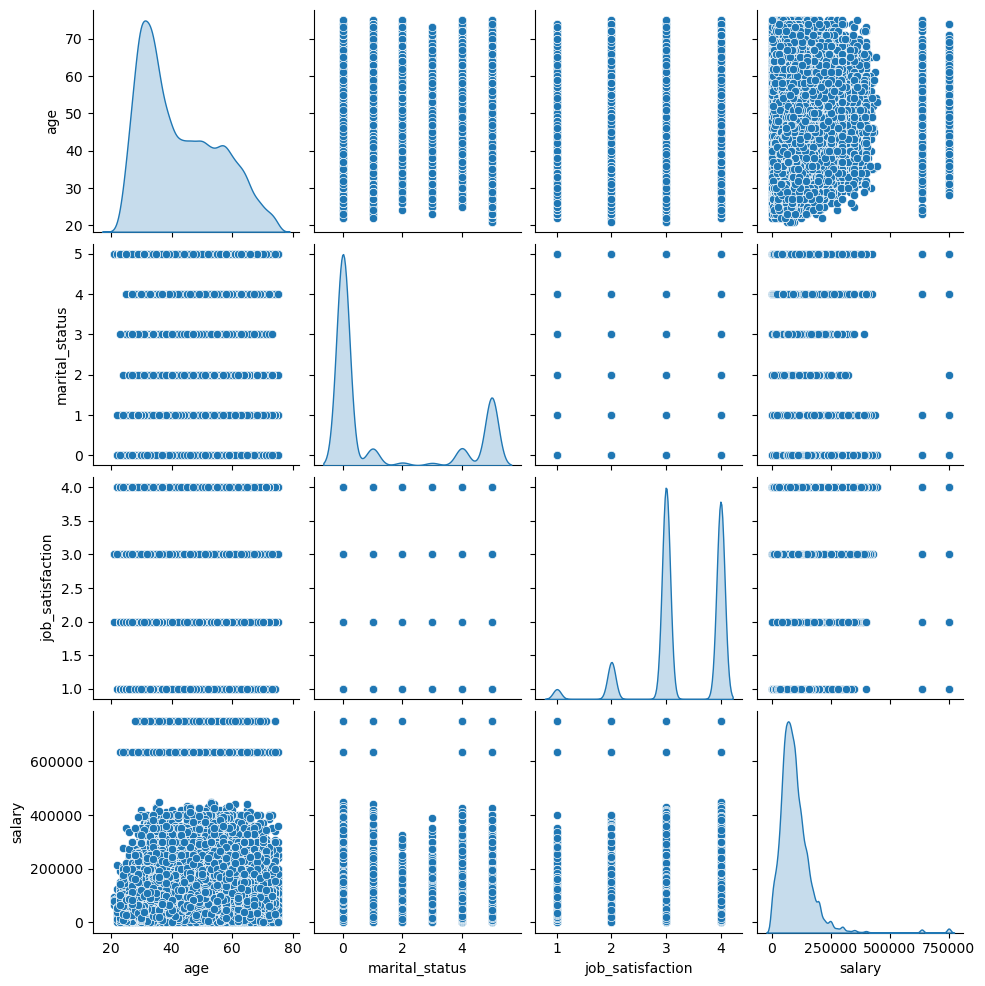

In [322]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of selected variables
variables_of_interest = ['age', 'gender', 'marital_status', 'job_satisfaction', 
                         'race','salary']

# Creating the pairplot using the selected variables
sns.pairplot(eda_nscg_21[variables_of_interest], diag_kind='kde')
plt.show()

### Key takeaways


Individual variables:

1. Age Distribution:
The age distribution (top left corner) shows a clear peak around the 30-40 age range. This suggests that most respondents are within this age group, with fewer respondents at younger and older ages.
2. Gender and Marital Status:
Gender and marital status are represented as binary or categorical variables, and the scatter plots involving these variables show distinct clusters. However, the scatter plots don't provide much detailed insight because these variables are categorical.
The gender and marital status distributions indicate that the data might be skewed toward certain categories (e.g., there might be more males than females or a specific marital status might be more common).
3. Job Satisfaction:
The job satisfaction variable is likely ordinal, and the pairwise scatter plots show distinct groupings, which is expected.
The relationship between job satisfaction and salary doesn’t appear to show a strong linear pattern. However, exploring this further with more targeted analysis might be necessary.
4. Salary Distribution:
The salary distribution is heavily right-skewed, with most respondents earning in the lower salary brackets. There are a few outliers with very high salaries, which could influence any correlations observed.

There doesn’t appear to be a strong linear relationship between salary and any of the other variables in this pairplot, which suggests that salary might be influenced by a combination of factors or that the relationships are more complex than can be captured by simple scatter plots.



We can investigate the distribution of salary a bit further:

In [323]:
import plotly.express as px
import plotly.graph_objects as go

# Calculate mean and median
mean_salary = eda_nscg_21["salary"].mean()
median_salary = eda_nscg_21["salary"].median()

# Plot 1: Salary Distribution
fig_salary = px.histogram(
    eda_nscg_21, 
    x="salary", 
    nbins=40, 
    title="Distribution of Salary",
    labels={"salary": "Salary (annualized)"}
)

# Convert to a go.Figure and add lines for mean and median
fig_salary = go.Figure(fig_salary)

# Add mean line with adjusted label position
fig_salary.add_vline(
    x=mean_salary, 
    line_width=2, 
    line_dash="dash", 
    line_color="blue",
    annotation_text="Mean", 
    annotation_position="top right",  # Adjusting this to move label
    annotation=dict(
        font_size=12,
        font_color="blue",
        align="left"
    )
)

# Add median line with adjusted label position
fig_salary.add_vline(
    x=median_salary, 
    line_width=2, 
    line_dash="dash", 
    line_color="red",
    annotation_text="Median", 
    annotation_position="top left",  # Adjusting this to move label
    annotation=dict(
        font_size=12,
        font_color="red",
        align="left"
    )
)

fig_salary.update_layout(
    title={
        'text': "Distribution of Salary across Survey Respondents (2021)",
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title="Salary in USD (annualized)",
    yaxis_title="Count",
    height=500,
    width=800
)

fig_salary.show()

In [324]:
eda_nscg_21['gender']

0         M
1         F
2         F
4         F
6         M
         ..
106271    M
106272    F
106276    F
106277    F
106278    F
Name: gender, Length: 84077, dtype: object

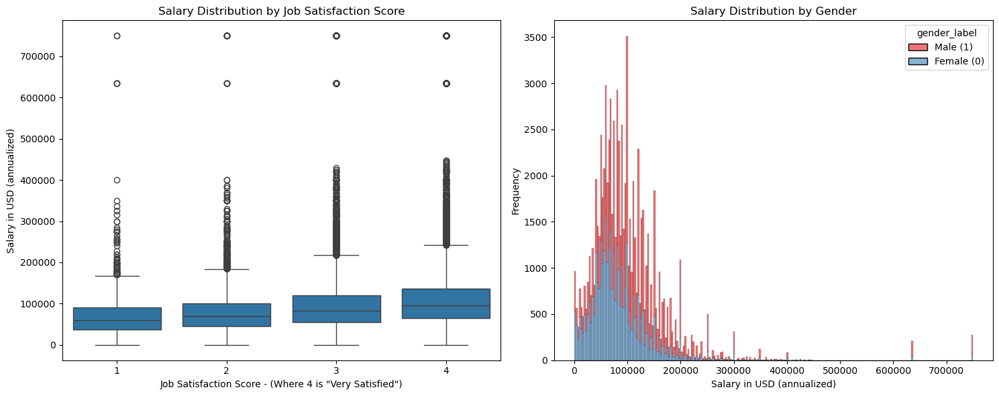

In [325]:
import seaborn as sns
import matplotlib.pyplot as plt

# Map gender values to labels
eda_nscg_21['gender_label'] = eda_nscg_21['gender'].map({'F': 'Female (0)', 'M': 'Male (1)'})

# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Boxplot: Distribution of salary by job satisfaction level
sns.boxplot(x='job_satisfaction', y='salary', data=eda_nscg_21, ax=axs[0])
axs[0].set_title('Salary Distribution by Job Satisfaction Score')
axs[0].set_xlabel('Job Satisfaction Score - (Where 4 is "Very Satisfied")')
axs[0].set_ylabel('Salary in USD (annualized)')

# Histogram: Overlay of salary distribution by gender (using the new gender_label column)
sns.histplot(data=eda_nscg_21, x='salary', hue='gender_label', multiple='stack', ax=axs[1], palette='Set1', alpha=0.6)
axs[1].set_title('Salary Distribution by Gender')
axs[1].set_xlabel('Salary in USD (annualized)')
axs[1].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()

plt.show()


In [326]:
final_nscg_21['job_satisfaction'].value_counts()

job_satisfaction
2    39063
1    36372
3     6824
4     1818
Name: count, dtype: int64

In [327]:
eda_nscg_21['job_satisfaction'].value_counts()

job_satisfaction
3    39063
4    36372
2     6824
1     1818
Name: count, dtype: int64

### Key takeaways

1.) Salary Ranges:

* The median salary across all higher job satisfaction levels shows slight increases, indicating that salary may not vary drastically based on job satisfaction alone, but it's still a factory.
* The boxes (interquartile ranges) are similar in size and position, suggesting that the middle 50% of salaries are consistent across different job satisfaction levels.

Outliers:

* There are significant outliers in the data, with a few individuals earning substantially higher salaries (above $400,000) across all levels of job satisfaction, especially at higher levels.


2.) Histogram: Salary Distribution by Gender

Overall Salary Distribution:

* The salary distribution is heavily right-skewed for both genders, with most salaries concentrated in the lower ranges (below $100,000).
* There is a noticeable overlap in the salary distributions of males and females, but the histogram reveals some differences in the frequency of salaries at certain levels.
Gender Differences:

* The red bars (males) are more prominent at higher salary levels compared to the blue bars (females), suggesting that a larger proportion of males are earning higher salaries.
* While both distributions peak in the same general salary range, the distribution for males extends further into the higher salary ranges, indicating a potential gender gap in earnings.

We can also explore this by degree subject, but will first need to refer back to the codes in the documentation, and plot salaries for the the 'Top 10 degree subjects' for the purposes of our analysis.

In [328]:
degree = {
    116710: "Computer and information sciences, general",
    116730: "Computer science",
    116740: "Computer systems analysis",
    116760: "Information services and systems",
    116770: "OTHER computer and information sciences",
    128410: "Applied mathematics",
    128420: "Mathematics, general",
    128430: "Operations research",
    128440: "Statistics",
    128450: "OTHER mathematics",
    216050: "Animal sciences",
    216060: "Food sciences and technology",
    216070: "Plant sciences",
    216080: "OTHER agricultural sciences",
    226310: "Biochemistry and biophysics",
    226320: "Biology, general",
    226330: "Botany",
    226340: "Cell and molecular biology",
    226350: "Ecology",
    226360: "Genetics, animal and plant",
    226370: "Microbiological sciences and immunology",
    226380: "Nutritional sciences",
    226390: "Pharmacology, human and animal",
    226400: "Physiology and pathology, human and animal",
    226410: "Zoology, general",
    226420: "OTHER biological sciences",
    236800: "Environmental science or studies",
    236810: "Forestry sciences",
    318730: "Chemistry, except biochemistry",
    328720: "Atmospheric sciences and meteorology",
    328740: "Earth sciences",
    328750: "Geology",
    328760: "Geological sciences, other (including oceanography)",
    338710: "Astronomy and astrophysics",
    338780: "Physics",
    348790: "OTHER physical sciences",
    416010: "Agricultural economics",
    419230: "Economics",
    429020: "Public policy studies",
    429270: "International relations",
    429280: "Political science and government",
    437040: "Educational psychology",
    438910: "Clinical psychology",
    438920: "Counseling psychology",
    438930: "Experimental psychology",
    438940: "General psychology",
    438950: "Industrial/Organizational psychology",
    438960: "Social psychology",
    438970: "OTHER psychology",
    449210: "Anthropology and archaeology",
    449220: "Criminology",
    449290: "Sociology",
    456200: "Area and Ethnic Studies",
    457710: "Linguistics",
    458610: "Philosophy of science",
    459240: "Geography",
    459300: "OTHER social sciences, including history of science",
    517210: "Aerospace, aeronautical and astronautical engineering",
    527250: "Chemical engineering",
    537230: "Architectural engineering",
    537260: "Civil engineering",
    547270: "Computer and systems engineering",
    547280: "Electrical, electronics and communications engineering",
    557330: "Industrial and manufacturing engineering",
    567350: "Mechanical engineering",
    577220: "Agricultural engineering",
    577240: "Bioengineering and biomedical engineering",
    577290: "Engineering sciences, mechanics and physics",
    577300: "Environmental engineering",
    577310: "Engineering, general",
    577340: "Materials engineering, including ceramics and textiles",
    577360: "Metallurgical engineering",
    577390: "Nuclear engineering",
    577410: "Other engineering, including geophysical, geological, mining, mineral, naval architecture, marine, and petroleum",
    617810: "Audiology and speech pathology",
    617820: "Health services administration",
    617830: "Health/medical assistants",
    617840: "Health/medical technologies",
    617850: "Medical preparatory programs (e.g. pre-dentistry,-medical,-veterinary)",
    617860: "Medicine (dentistry,optometry,osteopathic,podiatry,veterinary)",
    617870: "Nursing (4 years or longer program)",
    617880: "Pharmacy",
    617890: "Physical therapy and other rehabilitation/therapeutic services",
    617900: "Public health (including environmental health and epidemiology)",
    617910: "OTHER health/medical sciences",
    627020: "Computer teacher education",
    627060: "Mathematics teacher education",
    627090: "Science teacher education",
    627120: "Social science teacher education",
    636720: "Computer programming",
    636750: "Data processing",
    637510: "Electrical and electronic technologies",
    637520: "Industrial production technologies",
    637530: "Mechanical engineering-related technologies",
    637540: "OTHER engineering-related technologies",
    646100: "Architecture/Environmental Design",
    646520: "Actuarial science",
    716020: "OTHER agricultural business and production",
    716510: "Accounting",
    716530: "Business administration and management",
    716540: "Business, general",
    716550: "Business and managerial economics",
    716570: "Financial management",
    716590: "OTHER business management/administrative services",
    727010: "Education administration",
    727030: "Counselor education and guidance services",
    727050: "Elementary teacher education",
    727070: "Physical education and coaching",
    727080: "Pre-school/kindergarten/early childhood teacher education",
    727100: "Secondary teacher education",
    727110: "Special education",
    727130: "OTHER education",
    738620: "OTHER philosophy, religion, theology",
    739100: "Social Work",
    746560: "Business marketing/marketing management",
    746580: "Marketing research",
    757600: "English Language, literature and letters",
    757720: "OTHER foreign languages and literature",
    758200: "Liberal Arts/General Studies",
    759260: "History, other",
    759410: "Dramatic arts",
    759420: "Fine arts, all fields",
    759430: "Music, all fields",
    759440: "OTHER visual and performing arts",
    766610: "Communications, general",
    766620: "Journalism",
    766630: "OTHER communications",
    766820: "OTHER natural resources and conservation",
    766900: "Criminal Justice/Protective Services",
    768000: "Home Economics",
    768100: "Law/Prelaw/Legal Studies",
    768300: "Library Science",
    768500: "Parks, Recreation, Leisure, and Fitness Studies",
    769010: "Public administration",
    769030: "OTHER public affairs",
    769950: "OTHER FIELDS (Not Listed)"
}


In [329]:
# Convert the 'recent_degree_field' column to integers
eda_nscg_21['recent_degree_field'] = eda_nscg_21['recent_degree_field'].astype(int)
# Create a new column 'degree_description' by mapping the IDs to descriptions
eda_nscg_21['degree_description'] = eda_nscg_21['recent_degree_field'].map(degree)
# Display the updated DataFrame
print(eda_nscg_21['recent_degree_field'])

0         716530
1         716530
2         769010
4         727130
6         547280
           ...  
106271    567350
106272    577240
106276    438910
106277    226320
106278    769950
Name: recent_degree_field, Length: 84077, dtype: int64


In [330]:
# Extract the top 10 most frequent degree IDs
top_10_fields = eda_nscg_21['degree_description'].value_counts().nlargest(10).index
print(top_10_fields)

Index(['Electrical, electronics and communications engineering',
       'Mechanical engineering', 'Business administration and management',
       'Computer science', 'Civil engineering',
       'Nursing (4 years or longer program)', 'Chemistry, except biochemistry',
       'Biology, general', 'Economics', 'Law/Prelaw/Legal Studies'],
      dtype='object', name='degree_description')


In [331]:
# Filter the data to include only the top 10 degree descriptions
top_10_data = eda_nscg_21[eda_nscg_21['degree_description'].isin(top_10_fields)]
print(top_10_data)

        job_satisfaction  satisfaction_salary  satisfaction_advancement  \
0                      4                    4                         3   
1                      3                    4                         3   
6                      4                    4                         3   
8                      3                    4                         3   
17                     4                    3                         4   
...                  ...                  ...                       ...   
106253                 3                    2                         1   
106264                 3                    2                         3   
106265                 3                    3                         4   
106271                 3                    3                         3   
106277                 3                    3                         3   

        satisfaction_benefits  satisfaction_challenges  satisfaction_location  \
0                 

In [332]:
eda_nscg_21.isna().sum()

job_satisfaction                   0
satisfaction_salary                0
satisfaction_advancement           0
satisfaction_benefits              0
satisfaction_challenges            0
satisfaction_location              0
satisfaction_security              0
salary                             0
importance_society_contribution    0
job_degree_relation                0
recent_degree_field                0
recent_degree_type                 0
gender                             0
age                                0
age_group                          0
race                               0
employer_sector_detailed           0
employer_sector_summary            0
employer_size                      0
employer_location                  0
marital_status                     0
respondent_location_code           0
citizenship_status                 0
children_in_household              0
survey_year                        0
gender_label                       0
degree_description                 0
d

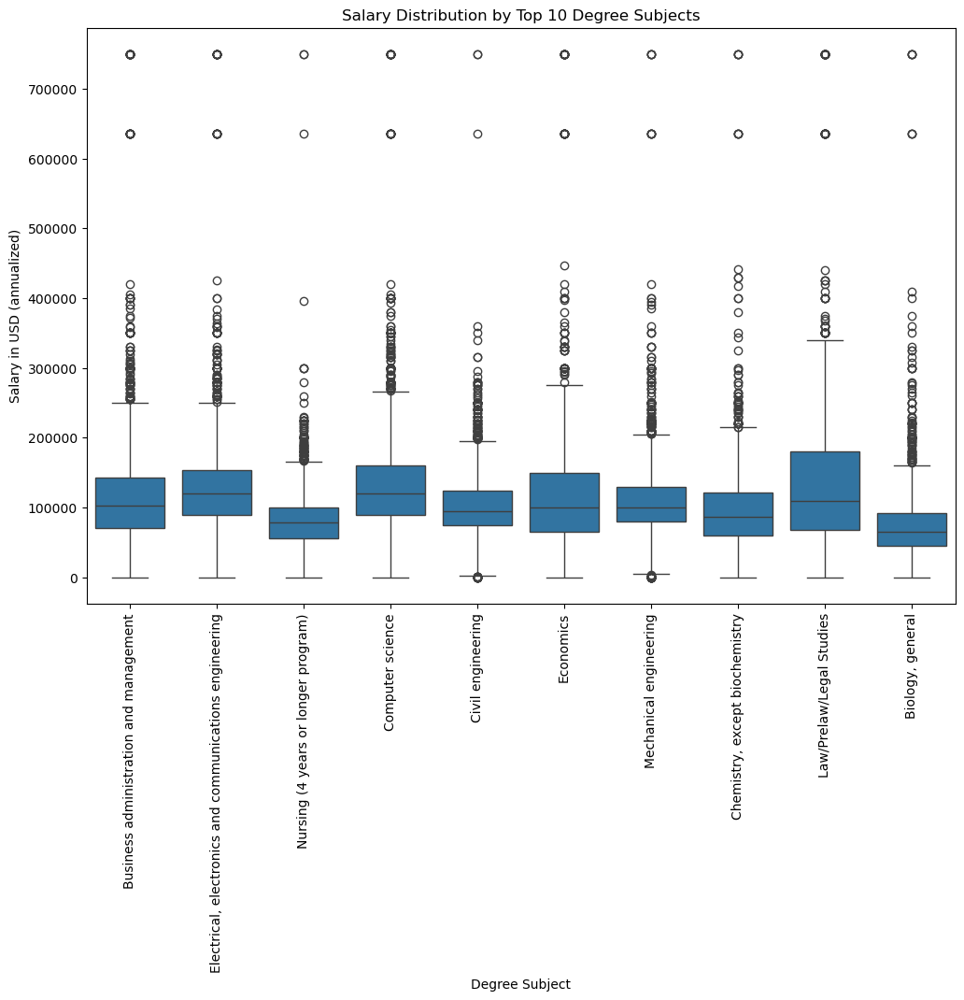

In [333]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a boxplot for the top 10 degree descriptions
plt.figure(figsize=(12, 8))
sns.boxplot(x='degree_description', y='salary', data=top_10_data)
plt.xticks(rotation=90)
plt.title('Salary Distribution by Top 10 Degree Subjects')
plt.xlabel('Degree Subject')
plt.ylabel('Salary in USD (annualized)')
plt.show()

# Key Findings and Takeaways from the Boxplot:
## General Salary Distribution Across Top 10 Degree Subjects:

* The boxplot displays the salary distribution for the top 10 most common degree subjects. Each box represents the interquartile range (IQR) of salaries, with the line inside the box indicating the median salary.
* Most of the degree subjects have a relatively similar median salary, falling in the range of approximately $75,000 to $100,000.

## Outliers:

* There are significant outliers across all degree subjects, with some salaries reaching upwards of $200,000, $300,000, and even beyond $700,000.
* These outliers are consistent across most of the degree subjects, indicating that within each field, there are individuals or small groups who earn significantly more than the majority.

## Degree-Specific Insights:

* Business administration and management and Economics appear to have the highest median salaries among the displayed degrees.
* Computer science and Electrical, electronics and communications engineering show a slightly narrower spread in salaries, suggesting less variability in earnings compared to some other fields.
* Nursing (4 years or longer program) has a relatively lower median salary compared to the other engineering and management fields, but it still exhibits a broad range of salaries.

## Law/Prelaw/Legal Studies:

* The Law/Prelaw/Legal Studies field shows a wider distribution with many outliers, which might indicate that while the typical salary is relatively high, the profession also includes a wider range of earnings.

## Mechanical Engineering:

* Mechanical Engineering shows a healthy median salary and has a relatively large interquartile range, indicating a diverse range of salaries in this field.

## Biology, general:

* Biology, general appears to have one of the lower median salaries among the top 10 degrees, but still shows a significant number of outliers at the higher salary levels.

Next we can explore the different indicators of job satisfaction, measured by job satisfaction scores/ratings on different aspects of an individual respondent's job.

In [334]:
# import plotly.graph_objects as go
from plotly.subplots import make_subplots
# import plotly.express as px

# Custom Likert scale labels, to support with interpretability - noting that we've already 'reverse' mapped the numbers
likert_labels = {
    1: "Very Dissatisfied",
    2: "Somewhat Dissatisfied",
    3: "Somewhat Satisfied",
    4: "Very Satisfied"
}

# Use the Viridis color palette
friendly_colors = px.colors.sequential.Viridis

# List of satisfaction-related columns
columns_to_transform = [
    'job_satisfaction',
    'satisfaction_salary',
    'satisfaction_advancement',
    'satisfaction_benefits',
    'satisfaction_challenges',
    'satisfaction_location',
    'satisfaction_security'
]

# Creating subplots
fig = make_subplots(
    rows=4, cols=2, 
    subplot_titles=[
        'Overall Job Satisfaction',
        'Satisfaction with Salary',
        'Satisfaction with Career Advancement',
        'Satisfaction with Benefits',
        'Satisfaction with Intellectual Challenge as part of their Job',
        'Satisfaction with Location',
        'Satisfaction with Levels of Job Security'
    ]
)

# Plotting each satisfaction-related column as a bar plot
for i, column in enumerate(columns_to_transform):
    # Count the occurrences of each satisfaction level
    value_counts = eda_nscg_21[column].value_counts(normalize=True).sort_index() * 100
    
    # Create bar plot
    fig.add_trace(
        go.Bar(
            x=[likert_labels[val] for val in value_counts.index],  # Replace x-axis with Likert labels
            y=value_counts,
            marker_color=friendly_colors[i % len(friendly_colors)],
            name=column.replace("_", " ").title(),
            texttemplate='%{y:.2f}%',  # Restrict hover text to 2 decimal places
            hoverinfo="text+y"
        ),
        row=(i // 2) + 1, col=(i % 2) + 1
    )
    
    # Update x and y-axis labels
    fig.update_xaxes(title_text='', row=(i // 2) + 1, col=(i % 2) + 1)
    fig.update_yaxes(
        title_text='Percentage (%)',  # Set y-axis title to Percentage (%)
        ticksuffix='%',  # Add percentage symbol to y-axis tick labels
        row=(i // 2) + 1, col=(i % 2) + 1
    )

# Update layout for the entire plot
fig.update_layout(
    height=1200,  # Increased height for more space
    width=1200,   # Increased width for more space
    title={
        'text': "Distribution of Satisfaction Ratings Across Various Job Aspects",
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    showlegend=False  # Remove legend since it's redundant
)

# Show the plot
fig.show()

Finally, we can explore other linked measures fo job satisfaction, relating to respondents' perceived signifciance of their job on society, and their perception of how much their degree skills are relevant to their jobs:

In [335]:
# Custom Likert scale labels for the new variables, for interpretability (noting we'd reverse mapped earlier)
likert_labels_contribution = {
    4: "Very Important",
    3: "Somewhat Important",
    2: "Somewhat Unimportant",
    1: "Not Important at All"
}

likert_labels_relation = {
    3: "Closely Related",
    2: "Somewhat Related",
    1: "Not Related"
}

# Friendly color palette
friendly_colors = px.colors.sequential.Viridis

# Creating subplots for the new set of variables
fig_other = make_subplots(
    rows=1, cols=2, 
    subplot_titles=[
        'Perceptions of their Job\'s Importance to Society',
        'Perceptions of Extent to Which Job is Related to their Degree'
    ]
)

# Plotting 'importance_society_contribution'
value_counts_contribution = eda_nscg_21['importance_society_contribution'].value_counts(normalize=True).sort_index() * 100
fig_other.add_trace(
    go.Bar(
        x=[likert_labels_contribution[val] for val in value_counts_contribution.index],
        y=value_counts_contribution,
        marker_color=friendly_colors[0],
        name='Importance of Job\'s Contribution to Society'
    ),
    row=1, col=1
)

# Plotting 'job_degree_relation'
value_counts_relation = eda_nscg_21['job_degree_relation'].value_counts(normalize=True).sort_index() * 100
fig_other.add_trace(
    go.Bar(
        x=[likert_labels_relation[val] for val in value_counts_relation.index],
        y=value_counts_relation,
        marker_color=friendly_colors[1],
        name='Extent to Which Job is Related to Degree'
    ),
    row=1, col=2
)

# Remove x and y-axis titles without altering default font and color
fig_other.update_xaxes(title_text='', row=1, col=1)
fig_other.update_yaxes(title_text='Percentage (%) Count', row=1, col=1)

fig_other.update_xaxes(title_text='', row=1, col=2)
fig_other.update_yaxes(title_text='Percentage (%) Count', row=1, col=2)

# Update layout for the entire plot without altering default font and color
fig_other.update_layout(
    height=600,  # Height for more space
    width=1000,  # Width for more space
    title={
        'text': "Survey Respondents' Ratings of Job's Importance to Society and Degree Relevance (2021)",
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'y': 0.95  # Move the title up
    },
    showlegend=False  # Remove legend since it's redundant
)

# Show the plot
fig_other.show()


### **Key insights**

### Opportunities for feature engineering

As we can see in the dataset, we've got a broad range of potential features, which can predict our target variables relating to job satisfaction, perceived importance to society and traditional indicators such as finance.

Here, we explore these different 'features' more carefully, and start understanding their potential relationships with our target variables of interest to formulate our hypotheses.

In [410]:
new_eda_nscg_21 = eda_nscg_21.copy()

In [411]:
new_eda_nscg_21['gender'].value_counts()

gender
M    48486
F    35591
Name: count, dtype: int64

In [412]:
final_nscg_21['gender'].value_counts()

gender
M    48486
F    35591
Name: count, dtype: int64

In [413]:
final_nscg_21['race'].value_counts()

race
4    55538
1    17997
3     6193
6     3522
2      527
5      300
Name: count, dtype: int64

In [414]:
new_eda_nscg_21['race'].value_counts()

race
4    55538
1    17997
3     6193
6     3522
2      527
5      300
Name: count, dtype: int64

In [415]:
final_nscg_21['marital_status'].value_counts(normalize=True) * 100

marital_status
1    66.346325
6    21.316174
5     5.402191
2     5.282063
3     0.884903
4     0.768343
Name: proportion, dtype: float64

In [416]:
new_eda_nscg_21['marital_status'].value_counts()

marital_status
0    55782
5    17922
4     4542
1     4441
2      744
3      646
Name: count, dtype: int64

We can focus first on some traditional demographic variables/indicators which are known in the literature to be significant predictors of salary and job advancement.

Let's first plot the distribution of some of these columns, mapping values as needed to their category names using the data dictionary / documentation. Here, we focus on **race, marital status and gender:**

In [417]:
# Convert columns to numeric, coercing errors to NaN
new_eda_nscg_21['race'] = new_eda_nscg_21['race'].astype(int)
new_eda_nscg_21['marital_status'] = new_eda_nscg_21['marital_status'].astype(int)
new_eda_nscg_21['gender'] = new_eda_nscg_21['gender'].replace({'F': 0, 'M': 1})
new_eda_nscg_21['gender'] = new_eda_nscg_21['gender'].astype(int)

# Mapping for race variable
race_mapping = {
    1: 'Asian',
    2: 'American Indian/Alaska Native',
    3: 'Black',
    4: 'White',
    5: 'Native Hawaiian/Other Pacific Islander',
    6: 'Multiple Race'
}

# Mapping for gender
gender_mapping = {
    0 : 'Female',
    1 : 'Male'
}

# Mapping for marital status
marital_status_mapping = {
    0: 'Married',
    1: 'Living in a marriage-like relationship',
    2: 'Widowed',
    3: 'Separated',
    4: 'Divorced',
    5: 'Never married'
}

# Apply mappings
new_eda_nscg_21['race'] = new_eda_nscg_21['race'].map(race_mapping)
new_eda_nscg_21['gender'] = new_eda_nscg_21['gender'].map(gender_mapping)
new_eda_nscg_21['marital_status'] = new_eda_nscg_21['marital_status'].map(marital_status_mapping)

# Calculate the percentage distribution for race, gender, and marital status and sort by descending order
race_counts = new_eda_nscg_21['race'].value_counts(normalize=True).sort_values(ascending=False) * 100
gender_counts = new_eda_nscg_21['gender'].value_counts(normalize=True).sort_values(ascending=False) * 100
marital_status_counts = new_eda_nscg_21['marital_status'].value_counts(normalize=True).sort_values(ascending=False) * 100

# Create subplots: 1 row, 3 columns
fig = make_subplots(
    rows=1, cols=3, 
    subplot_titles=(
        "Survey Respondents by Race",
        "Survey Respondents by Gender",
        "Survey Respondents by Marital Status"
    )
)

# Define the color palette
colors = px.colors.sequential.Viridis

# Race Distribution
fig.add_trace(
    go.Bar(
        x=race_counts.index, 
        y=race_counts.values, 
        marker=dict(color=colors[0]),
        hovertemplate='%{x}: %{y:.2f}%<extra></extra>'
    ),
    row=1, col=1
)

# Gender Distribution
fig.add_trace(
    go.Bar(
        x=gender_counts.index, 
        y=gender_counts.values, 
        marker=dict(color=colors[2]),
        hovertemplate='%{x}: %{y:.2f}%<extra></extra>'
    ),
    row=1, col=2
)

# Marital Status Distribution
fig.add_trace(
    go.Bar(
        x=marital_status_counts.index, 
        y=marital_status_counts.values, 
        marker=dict(color=colors[4]),
        hovertemplate='%{x}: %{y:.2f}%<extra></extra>'
    ),
    row=1, col=3
)

# Update layout
fig.update_layout(
    height=600, width=1200,
    title_text="Demographic Distributions of Survey Respondents: Race, Gender, and Marital Status",
    showlegend=False,
    template="plotly_white"
)

# Update x-axis labels and rotation for each subplot
fig.update_xaxes(tickangle=45, row=1, col=1)
fig.update_xaxes(tickangle=45, row=1, col=2)
fig.update_xaxes(tickangle=45, row=1, col=3)

# Update y-axis title
fig.update_yaxes(title_text="Percentage (%)", row=1, col=1)
fig.update_yaxes(title_text="Percentage (%)", row=1, col=2)
fig.update_yaxes(title_text="Percentage (%)", row=1, col=3)

# Show the plot
fig.show()


/var/folders/d8/f47z80nj3835j2cjhqsrtc6r0000gn/T/ipykernel_6510/515876891.py:4: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



We can see in the data there are a number of codes representing the values - we can look to the documentation to extract these values and save these codes for our use as dictionaries:

In [418]:
new_eda_nscg_21.dtypes

job_satisfaction                            int64
satisfaction_salary                         int64
satisfaction_advancement                    int64
satisfaction_benefits                       int64
satisfaction_challenges                     int64
satisfaction_location                       int64
satisfaction_security                       int64
salary                                    float64
importance_society_contribution             int64
job_degree_relation                         int64
recent_degree_field                         int64
recent_degree_type                         object
gender                                     object
age                                       float64
age_group                                 float64
race                                       object
employer_sector_detailed                     int8
employer_sector_summary                      int8
employer_size                                int8
employer_location                          object


Next it'll be helpful to plot across degree type, and employer/workplace-linked characteristics (such as employer location, the respondents' place of residence).

In [419]:
#Converting recent degree field, employer location and respondent location to support with plotting
new_eda_nscg_21['employer_location'] = new_eda_nscg_21['employer_location'].astype(int)
new_eda_nscg_21['respondent_location_code'] = new_eda_nscg_21['respondent_location_code'].astype(int)

In [420]:
employer_location = {
    85: "New England region, state not specified",
    86: "Middle Atlantic region, state not specified",
    87: "East North Central region, state not specified",
    88: "West North Central region, state not specified",
    89: "South Atlantic region, state not specified",
    90: "East South Central region, state not specified",
    91: "West South Central region, state not specified",
    92: "Mountain region, state not specified",
    93: "Pacific region, state not specified",
    96: "U.S. Territory, not specified",
    138: "United Kingdom, not specified",
    148: "Europe, not specified",
    245: "Asia, not specified",
    247: "East Asia, not specified",
    255: "Southeast Asia, not specified",
    353: "Caribbean, not specified",
    389: "South America, not specified",
    399: "SUPPRESSED South America",
    462: "Africa, not specified",
    998: "Logical Skip"
}


In [421]:
respondent_location = {
    85: "New England region, state not specified",
    86: "Middle Atlantic region, state not specified",
    87: "East North Central region, state not specified",
    88: "West North Central region, state not specified",
    89: "South Atlantic region, state not specified",
    90: "East South Central region, state not specified",
    91: "West South Central region, state not specified",
    92: "Mountain region, state not specified",
    93: "Pacific region, state not specified",
    96: "U.S. Territory, not specified",
    138: "United Kingdom, not specified",
    148: "Europe, not specified",
    245: "Asia, not specified",
    247: "East Asia, not specified",
    255: "Southeast Asia, not specified",
    353: "Caribbean, not specified",
    389: "South America, not specified",
    399: "SUPPRESSED South America",
    462: "Africa, not specified",
    555: "Abroad, not specified"
}


Using these mappings, and given the large number of categories - let's focus first on understand some of the **Top 10 degree fields** and **Top 10 locations** of our survey respondents:

In [422]:
# Apply mappings using your saved dictionaries
new_eda_nscg_21['employer_location'] = new_eda_nscg_21['employer_location'].map(employer_location)
new_eda_nscg_21['respondent_location_code'] = new_eda_nscg_21['respondent_location_code'].map(respondent_location)

# Columns to filter for top 10
top10_columns = ['employer_location', 'respondent_location_code']

# Plotting the top 10 categories for each selected variable
fig_top10 = make_subplots(
    rows=len(top10_columns), cols=1, 
    subplot_titles=[col.replace('_', ' ').title() for col in top10_columns]
)

for i, column in enumerate(top10_columns):
    top10 = new_eda_nscg_21[column].value_counts(normalize=True).nlargest(10) * 100
    fig_top10.add_trace(
        go.Bar(
            x=top10.index.map(str),  # Convert to string for better labeling
            y=top10,
            marker_color=px.colors.sequential.Viridis[i % len(px.colors.sequential.Viridis)],
            name=column.replace('_', ' ').title()
        ),
        row=i+1, col=1
    )

# Update layout and axis labels
fig_top10.update_layout(
    height=1600, 
    width=1200, 
    title_text="Top 10 Categories for degree field, employer location & respondent location",
    showlegend=False  # Optionally remove the legend if it's redundant
)

fig_top10.update_yaxes(title_text="Percentage (%)")

fig_top10.show()

### Beginning to understand the relationships between our target and feature variables

We've developed a better understanding of a number of our variables and columns present in the dataset. But how might our potential feature vairables link with our potential target variables?

(1) First let's explore the potential relationship between our two dimensions of 'job matching' - salary and overall job satisfaction scores.

In [423]:
# Create a scatter plot
fig = px.scatter(
    new_eda_nscg_21, 
    x='salary', 
    y='job_satisfaction', 
    title="Scatter Plot of Salary vs. Job Satisfaction",
    labels={
        'salary': 'Salary (Annualized)',
        'job_satisfaction': 'Job Satisfaction (Overall Score)'
    },
    hover_data=['gender', 'race', 'marital_status', 'age'],  # Additional hover data for context
    color='job_satisfaction',  # Color by job satisfaction score for more insights
    color_continuous_scale=px.colors.sequential.Viridis,  # Color scale
)

# Update layout for better presentation
fig.update_layout(
    height=600,
    width=800,
    title={
        'x': 0.5,
        'xanchor': 'center'
    }
)

# Show the plot
fig.show()


Job Satisfaction Levels: The scatter plot shows that respondents' job satisfaction is grouped into specific levels rather than varying continuously. This is expected if the job satisfaction score is an ordinal variable.

Correlation Insights: While the plot can still show some correlation between salary and job satisfaction, the discrete nature of the satisfaction scores means that we're looking at relationships between salary and each satisfaction level rather than a continuous relationship. We will likely consider.

Other key insights:


Concentration at High Satisfaction Levels: The plot shows that many respondents report higher job satisfaction levels (3 and 4), particularly clustered at certain salary ranges. This suggests that a significant portion of respondents are relatively satisfied with their jobs.
Lower Satisfaction Levels: There are also respondents in the lower satisfaction categories (1 and 2), but these appear less frequently. The presence of these lower satisfaction levels across a wide salary range suggests that salary alone might not be the sole determinant of job satisfaction.

Relationship Between Salary and Job Satisfaction:

Lack of Strong Correlation: The scatter plot does not show a strong linear relationship between salary and job satisfaction. For example, individuals earning high salaries still report lower satisfaction (e.g., 1 or 2), and individuals with lower salaries can report high satisfaction (4). This suggests that factors other than salary play a significant role in determining job satisfaction.


(2) Next, let's plot the distributions of some of our target variables of interest, by some of our feature variables.

Gender pay gap is one of the most studied aspects of workforce demographics is the gender pay gap, where research has shown that, on average, women often earn less than men for similar roles and responsibilities. This disparity is a critical area of focus for understanding broader issues of equity in the workplace.

Job Satisfaction and Gender: Gender can also play a significant role in job satisfaction due to various factors like work-life balance, career advancement opportunities, and workplace culture. Analyzing job satisfaction by gender can help identify whether there are systemic issues affecting how satisfied different genders are in their jobs.

Given this, we'll do some initial analysis on distribution of our target variables of interest by gender/

In [424]:
# Salary Distribution by Marital Status
fig_salary_marital = px.box(
    new_eda_nscg_21, 
    x='salary', 
    y='marital_status', 
    title="Salary Distribution by Marital Status (2021)",
    labels={'salary': 'Salary (Annualized)', 'marital_status': 'Marital Status'},
    width=800, 
    height=500,
    color='marital_status',
    color_discrete_sequence=px.colors.sequential.Viridis  # Use a qualitative color scale for categories
)

fig_salary_marital.update_layout(
    xaxis_title="Salary (Annualized)",
    yaxis_title="Marital Status",
    showlegend=False  # Remove legend since we're focusing on marital status
)

fig_salary_marital.show()


We've gained a bit more insight into the distribution of salary - to understand more about our different components of 'job matching success' including the elements of job satisfaction, let's actually map our the pearson correlation values to better make a start on understanding this:

In [429]:

from scipy.stats import pearsonr
from scipy import stats  # Import the stats module from scipy


# Define selected columns
selected_columns = [
    'job_satisfaction', 'satisfaction_salary', 'satisfaction_advancement', 'satisfaction_benefits', 'satisfaction_challenges', 'importance_society_contribution', 'job_degree_relation',
    'salary', 'recent_degree_type', 'gender', 'age', 'race', 'employer_sector_summary', 'recent_degree_field', 'marital_status'
]

# Convert categorical columns to numeric using label encoding
df_numeric = new_eda_nscg_21[selected_columns].copy()
df_numeric['recent_degree_type'] = df_numeric['recent_degree_type'].astype('category').cat.codes
df_numeric['gender'] = df_numeric['gender'].astype('category').cat.codes
df_numeric['race'] = df_numeric['race'].astype('category').cat.codes
df_numeric['employer_sector_summary'] = df_numeric['employer_sector_summary'].astype('category').cat.codes
df_numeric['recent_degree_field'] = df_numeric['recent_degree_field'].astype('category').cat.codes
df_numeric['marital_status'] = df_numeric['marital_status'].astype('category').cat.codes


# Calculate the correlation matrix
correlation_matrix = df_numeric.corr()

# Compute the p-values matrix
p_values_matrix = df_numeric.corr(method=lambda x, y: stats.pearsonr(x, y)[1]) - np.eye(len(df_numeric.columns))

# Define significance level
significance_level = 0.05
significant_corr = correlation_matrix.copy()

# Add asterisks to significant correlations
for i in correlation_matrix.columns:
    for j in correlation_matrix.columns:
        if p_values_matrix.loc[i, j] < significance_level:
            significant_corr.loc[i, j] = f"{correlation_matrix.loc[i, j]:.2f}*"
        else:
            significant_corr.loc[i, j] = f"{correlation_matrix.loc[i, j]:.2f}"

# Create an interactive heatmap with Plotly, including correlation values and asterisks
fig = go.Figure(data=go.Heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns,
    y=correlation_matrix.index,
    colorscale='YlOrRd',  # Yellow to red color scale
    zmin=-1, zmax=1,
    colorbar=dict(title="Correlation"),
    text=significant_corr.values,  # Use the significant correlations with asterisks
    hoverinfo='text',  # Only show the rounded correlation value on hover
))

# Add correlation values as text on the heatmap
fig.update_traces(
    texttemplate="%{text}",
    textfont=dict(color="black"),
)

# Update layout for better readability
fig.update_layout(
    title='Correlation Heatmap for indicators of Job Success and Selected Features (* indicates p-value < 0.05)',
    xaxis_nticks=36,
    height=800,
    width=1000
)

# Show the interactive plot
fig.show()


/var/folders/d8/f47z80nj3835j2cjhqsrtc6r0000gn/T/ipykernel_6510/3136575293.py:35: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.00*' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

/var/folders/d8/f47z80nj3835j2cjhqsrtc6r0000gn/T/ipykernel_6510/3136575293.py:35: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.52*' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

/var/folders/d8/f47z80nj3835j2cjhqsrtc6r0000gn/T/ipykernel_6510/3136575293.py:35: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.56*' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

/var/folders/d8/f47z80nj3835j2cjhqsrtc6r0000gn/T/ipykernel_6510/313657529

### Key insights

### Key Insights from the Correlation Heatmap:

Strong Positive Correlation Between Job Satisfaction and Salary Satisfaction:

* The strongest correlation observed is between job_satisfaction and satisfaction_salary (r = 0.52*). * * * This suggests that satisfaction with salary is a significant factor contributing to overall job satisfaction.

 Positive Correlation Between Salary and Job Satisfaction:

* There is a moderate positive correlation between salary and job_satisfaction (r = 0.15*). This indicates that higher salaries tend to be associated with higher job satisfaction, though the correlation is not as strong as the one with salary satisfaction.

Age and Salary:

* There is a positive correlation between age and salary (r = 0.13*). This likely reflects the typical progression of salary with increasing experience and tenure.

Correlation Between Job Degree Relevance and Job Satisfaction:

* There is a positive correlation between job_degree_relation and job_satisfaction (r = 0.15*). This indicates that individuals whose jobs are more closely related to their degree tend to report higher job satisfaction.

Gender and Job Satisfaction:

* The correlation between gender and job_satisfaction is relatively low (r = 0.04*), suggesting that while there may be some differences in job satisfaction between genders, they are not as pronounced as other factors like salary or job relevance.


Impact of Employer Sector:

* The employer_sector_summary shows some small correlations with several variables, including a negative correlation with job_satisfaction (r = -0.01), though most of these correlations are weak. This suggests that the sector in which a respondent is employed might have a minor influence on job satisfaction.

Caveats and Considerations:


Coding of Categorical Variables:

* Race, Gender, Degree Type, and Employer Sector: These variables were coded numerically using label encoding. This approach assigns arbitrary numeric values to categories, which might lead to misleading correlations. For example, the correlation between gender and job satisfaction doesn't necessarily imply causality or a linear relationship because the numeric codes do not inherently carry ordinal information.

Ordinal Variables:

Job Satisfaction and Salary Satisfaction: 

* These are ordinal variables that were treated as integers in this correlation analysis. While treating them as numeric allows for correlation calculation, it can sometimes obscure the true nature of the relationship, especially when the ordinal levels do not have equal intervals.



## Summary of findings

### Emerging insights

Emerging Insights from the Visualizations:

Salary Distribution by Gender and Marital Status:

* Gender: The salary distribution shows that males generally have a higher range of salaries compared to females. The median salary for males is also higher, suggesting a potential gender pay gap.
* Marital Status: Married individuals tend to have higher median salaries compared to other marital statuses, with more variability in their earnings. This could indicate that marital status may be a significant factor in predicting salary, which might relate to stability, experience, or other socio-economic factors.

Top 10 Categories for Mapped Variables:

* Recent Degree Field and Employer Location: Fields like engineering (Electrical, Mechanical) and Business Administration are prevalent among graduates, and employers in the Pacific region dominate the location distribution. These factors might be important in determining job matches and salary expectations, indicating that certain degrees or locations may be more favorable for higher earnings or job satisfaction.

Demographic Distributions:

* The racial distribution shows a majority of white respondents, with Asians being the second largest group. Gender distribution is slightly skewed towards males, and marital status is predominantly married. These distributions will influence the generalizability of your findings and might introduce biases if not properly accounted for in your model.

Job Satisfaction and Related Variables:

* Most respondents are somewhat or very satisfied with their jobs, especially with their salary and job location. However, satisfaction with career advancement and intellectual challenge shows more variability. These aspects could be critical components of your composite "successful job match" variable, as they directly relate to the qualitative aspects of employment.

Correlation Heatmap:

* Salary and Job Satisfaction: There’s a moderate positive correlation between salary and job satisfaction. This confirms that salary is a critical component of a successful job match.
* Job Degree Relevance: The positive correlation between job satisfaction and the relevance of the degree to the job suggests that aligning one’s degree with the job role is important for job satisfaction, and by extension, a successful job match.

Implications for Constructing a Composite Y-Variable:

Our composite Y-variable for a "successful job match" should likely include:

* Salary: Given its strong correlation with job satisfaction.
* Job Satisfaction: This directly reflects how content individuals are in their roles.
* Job Degree Relevance: As it appears to impact job satisfaction significantly.

We might consider weighting these components based on their importance or correlation strengths.







### Formulating hypotheses

Based on my findings till date, there are a few hypotheses I can state, which can be further explored as part of the next sprint:

(a) Hypotheses for constructing a composite variable

H1: Key Satisfaction Elements as Core Components

Hypothesis: The distribution plots for job satisfaction elements (e.g., overall job satisfaction, salary satisfaction, career advancement satisfaction) and their correlations suggest that these elements should be central to the composite variable for a "successful job match."

The strong positive correlations between overall job satisfaction and specific elements like salary satisfaction and career advancement indicate that these variables significantly contribute to the perception of a successful job match.

Potential Next Steps:
* Include these satisfaction elements as key components in the composite variable.
* Open Question: How should we determine the weighting of each satisfaction element within the composite variable? One approach could involve using the correlation strengths as a basis for weighting, with stronger correlations receiving higher weights.


H2: Degree-Job Alignment as a Core Component

Hypothesis: The relevance of a graduate’s degree to their current job, supported by its positive correlation with job satisfaction, should be a core component of the composite variable for a "successful job match."

 The correlation analysis and distributions indicate that when a graduate's job aligns with their degree, job satisfaction tends to be higher. This alignment should therefore be a significant part of the composite measure.

Potential Next Steps:
*Incorporate degree-job alignment into the composite variable, potentially as a weighted component reflecting its correlation strength.


(b) Hypotheses for feature engineering opportunities

H3: Significant Variables for Feature Engineering relate to demographics

Hypothesis: The correlation analysis highlights several significant variables that should be carefully engineered to improve model accuracy in predicting a successful job match, such as gender, age and race

H4: Regional Factors

Geographic location (employer location, respondent location) might influence salary and job satisfaction due to regional economic conditions, cost of living, and job market dynamics.


This hasn't been explored yet, as part of this sprint. Next, it'll be interesting to engineer features based on the respondent’s or employer’s location, such as region or state-level economic indicators, to see if these factors play a significant role in predicting a successful job match.


## Next steps



Investigating the time element (which we haven't done yet):
* Merge with datasets beyond 2021 to model trends in employment over time, and clean appropriately
* It may be interesting to explore outcomes pre-Covid vs post-Covid

Build on correlation heatmap to understand relationships:
* Finish plotting relationships across other variables - e.g., can we dig deeper into the relationship between popular degree subjects (e.g., Engineering) and job satisfaction?

Inspect and continue pre-processing of variables:
* Get data ready (i.e., inspecting data-types) for baseline modelling
* Research and finalise proposed modelling approach - to consider decision trees?
* Identify appropriate feature engineering strategies

Experiment with our first composite y/target-variable:
* Consider salary, job satisfaction and degree-job alignment as core variables
* Experiment with different weightings to improve model accuracy - could strength of correlations help make a start on this?

Think about the ‘stretch goal’ use case for my final models - a recommendation tool
* Is there additional data required for this? E.g., online job postings, basic user inputs
